## Análise de Dados sobre Coronavírus no Brasil / Rio de Janeiro
##### Autor: Ramon Jeronimo de Souza
<h4> </h4>

<h4>Dados:</h4>
<p style="color:white">Dataset: https://www.kaggle.com/unanimad/corona-virus-brazil</p>

##### 1- Bibliotecas Utilizadas no Estudo

In [1]:
# Importar bibliotecas:
import pandas as pd
import numpy as np
import datetime
from datetime import date
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.graph_objs import *
from IPython.display import HTML

##### 2- Tratamento dos Dados

In [2]:
# Carregar primeira base:
df = pd.read_csv('C:/Users/ramon/OneDrive/Documentos/Projetos/Pessoal/DataScience/DataFanProject/corona_virus/bancos_de_dados/brazil_covid19_cities.csv')
df_coord = pd.read_csv('C:/Users/ramon/OneDrive/Documentos/Projetos/Pessoal/DataScience/DataFanProject/corona_virus/bancos_de_dados/brazil_cities_coordinates.csv').rename(
                    columns={'city_name': 'name'})
df_pop = pd.read_csv('C:/Users/ramon/OneDrive/Documentos/Projetos/Pessoal/DataScience/DataFanProject/corona_virus/bancos_de_dados/brazil_population_2019.csv',
                    sep = ';', encoding = 'utf-8').rename(columns={'População 2010':'População',
                                                                  'Município': 'name'})
print(df.head())
print('')
print(df.tail())

         date     state                   name    code  cases  deaths
0  2020-03-28      Acre             Rio Branco  120040     25       0
1  2020-03-28   Alagoas                 Maceió  270430     13       0
2  2020-03-28   Alagoas  Porto Real do Colégio  270750      1       0
3  2020-03-28     Amapá                 Macapá  160030      4       0
4  2020-03-28  Amazonas           Boca do Acre  130070      1       0

              date      state                     name    code  cases  deaths
127659  2020-05-29  Tocantins  Sítio Novo do Tocantins  172080     67       1
127660  2020-05-29  Tocantins           Tocantinópolis  172120     88       3
127661  2020-05-29  Tocantins               Tocantínia  172110      1       0
127662  2020-05-29  Tocantins             Wanderlândia  172208     16       0
127663  2020-05-29  Tocantins                  Xambioá  172210    128       2


In [3]:
# Verificar as principais informações do dataset:
print(df.info())
print('')
print('Número de linhas e colunas:')
print(df.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127664 entries, 0 to 127663
Data columns (total 6 columns):
date      127664 non-null object
state     127664 non-null object
name      127664 non-null object
code      127664 non-null int64
cases     127664 non-null int64
deaths    127664 non-null int64
dtypes: int64(3), object(3)
memory usage: 5.8+ MB
None

Número de linhas e colunas:
(127664, 6)


In [4]:
# Converter a coluna "date" para data:
df['date'] = pd.to_datetime(df['date'])
last_date = df.sort_values(by='date', ascending=False)
last_date = pd.to_datetime(last_date['date'].iloc[0]).date()
today = datetime.datetime.strftime(last_date, '%d/%m/%Y')
print(df.head())
print('')
print(df.info())

        date     state                   name    code  cases  deaths
0 2020-03-28      Acre             Rio Branco  120040     25       0
1 2020-03-28   Alagoas                 Maceió  270430     13       0
2 2020-03-28   Alagoas  Porto Real do Colégio  270750      1       0
3 2020-03-28     Amapá                 Macapá  160030      4       0
4 2020-03-28  Amazonas           Boca do Acre  130070      1       0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127664 entries, 0 to 127663
Data columns (total 6 columns):
date      127664 non-null datetime64[ns]
state     127664 non-null object
name      127664 non-null object
code      127664 non-null int64
cases     127664 non-null int64
deaths    127664 non-null int64
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 5.8+ MB
None


In [5]:
# Verificar a existência de dados nulos:
df.isnull().sum()

date      0
state     0
name      0
code      0
cases     0
deaths    0
dtype: int64

##### 4- Análise de Dados

In [6]:
# Gráfico do total de casos por dia no Brasil:
df_total_cases_deaths_brazil = df.groupby('date').sum().drop(
                                'code', axis=1).reset_index()
fig = go.Figure(data=[go.Bar(x=df_total_cases_deaths_brazil['date'], 
             y=df_total_cases_deaths_brazil['cases'], marker_color='#009999')],
             layout=go.Layout(title=go.layout.Title(
            text='Total de casos por dia no Brasil até ' + today),
            xaxis_title="Data", yaxis_title = 'Casos'))
fig.show()

In [7]:
# Gráfico do total de mortes por dia no Brasil:
fig = go.Figure(data=[go.Bar(x=df_total_cases_deaths_brazil['date'], 
             y=df_total_cases_deaths_brazil['deaths'], marker_color='#990000')],
             layout=go.Layout(title=go.layout.Title(
            text='Total de mortes por dia no Brasil até ' + today),
            xaxis_title="Data", yaxis_title = 'Mortes'))
fig.show()

In [8]:
# Gráfico do total de casos por Estado:
df_total_cases_deaths = df[df['date'] == last_date]
df_total_cases_deaths = df_total_cases_deaths.groupby('state').sum().drop('code', axis=1).sort_values(
                            by='cases', ascending=False).reset_index()

limity = dict(range=[0, max(df_total_cases_deaths['cases'])+5000])
fig = go.Figure(data=[go.Bar(x=df_total_cases_deaths['state'], 
             y=df_total_cases_deaths['cases'], marker_color='#009999')],
             layout=go.Layout(yaxis=limity, 
            title=go.layout.Title(
            text='Total de casos por Estado até ' + today), 
            xaxis_title="Estados", yaxis_title = 'Casos', ))

fig.show()

C:\Users\ramon\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and 'the values will not compare equal to the
'datetime.date'. To retain the current behavior, convert the
'datetime.date' to a datetime with 'pd.Timestamp'.



In [9]:
# Gráfico do total de mortes por Estado:
df_total_cases_deaths = df[df['date'] == last_date]
df_total_cases_deaths = df_total_cases_deaths.groupby('state').sum().drop('code', axis=1).sort_values(
                            by='deaths', ascending=False).reset_index()

limity = dict(range=[0, max(df_total_cases_deaths['deaths'])+1000])
fig = go.Figure(data=[go.Bar(x=df_total_cases_deaths['state'], 
             y=df_total_cases_deaths['deaths'], marker_color='#990000')],
             layout=go.Layout(yaxis=limity, 
            title=go.layout.Title(
            text='Total de mortes por Estado até ' + today), 
            xaxis_title="Estados", yaxis_title = 'Mortes'))

fig.show()

C:\Users\ramon\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and 'the values will not compare equal to the
'datetime.date'. To retain the current behavior, convert the
'datetime.date' to a datetime with 'pd.Timestamp'.



In [10]:
# Gráfico da evolução do total de casos por Estado - Top 5 Estados:
list_states_cases = df[df['date'] == last_date]
list_states_cases = list_states_cases.groupby('state').sum().drop('code', axis=1).sort_values(
                            by='cases', ascending=False).reset_index()
list_states_cases = list_states_cases.nlargest(5, 'cases')
list_states_cases = list_states_cases['state'].tolist()

df_total_cases_deaths_states = df.groupby(
                ['date', 'state']).sum().drop('code', axis=1).sort_values(by='cases').reset_index()
df_total_cases_deaths_states = df_total_cases_deaths_states[
                df_total_cases_deaths_states['state'].isin(list_states_cases)]

fig = px.line(df_total_cases_deaths_states, 
                x='date', y='cases', color='state')
fig.update_layout(title='Evolução do Total de Casos por Estado - Top 5',
                  xaxis_title='Data', yaxis_title='Casos', legend_title='Estados',
                  legend=dict(x=0.02,y=0.98))
fig.show()

C:\Users\ramon\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and 'the values will not compare equal to the
'datetime.date'. To retain the current behavior, convert the
'datetime.date' to a datetime with 'pd.Timestamp'.



In [11]:
# Gráfico da evolução de mortes por Estado - Top 5 Estados:
list_states_deaths = df[df['date'] == last_date]
list_states_deaths = list_states_deaths.groupby('state').sum().drop('code', axis=1).sort_values(
                            by='deaths', ascending=False).reset_index()
list_states_deaths = list_states_deaths.nlargest(5, 'deaths')
list_states_deaths = list_states_deaths['state'].tolist()

df_total_cases_deaths_states = df.groupby(
                ['date', 'state']).sum().drop('code', axis=1).sort_values(by='deaths').reset_index()
df_total_cases_deaths_states = df_total_cases_deaths_states[
                df_total_cases_deaths_states['state'].isin(list_states_deaths)]

fig = px.line(df_total_cases_deaths_states, 
                x='date', y='deaths', color='state')
fig.update_layout(title='Evolução do Total de Mortes por Estado - Top 5',
                  xaxis_title='Data', yaxis_title='Mortes', legend_title='Estados',
                  legend=dict(x=0.02,y=0.98))
fig.show()

C:\Users\ramon\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and 'the values will not compare equal to the
'datetime.date'. To retain the current behavior, convert the
'datetime.date' to a datetime with 'pd.Timestamp'.



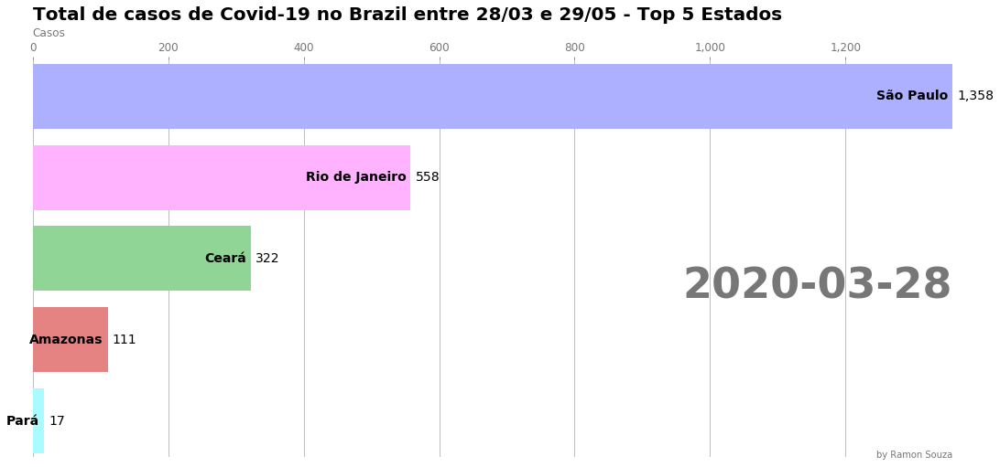

In [16]:
# Gráfico "Bar Racing" com o total de casos por Estado - Top 5:
df_total_cases_deaths_states_day = df.groupby(['date', 'state']).sum().drop('code', axis=1).reset_index()
df_total_cases_deaths_states_day = df_total_cases_deaths_states_day[
    df_total_cases_deaths_states_day['state'].isin(list_states_cases)].sort_values(by='date', ascending=True)

colors = dict(zip(['São Paulo', 'Rio de Janeiro', 'Ceará', 'Amazonas', 'Pará'],
                 ['#adb0ff', '#ffb3ff', '#90d595', '#e48381', '#aafbff']))
fig, ax = plt.subplots(figsize=(18, 8))
def racing_barchart(data):
    dff = df_total_cases_deaths_states_day[
    df_total_cases_deaths_states_day['date'] == data].sort_values(by='cases', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['state'], dff['cases'], color=[colors[x] for x in dff['state']])
    dx = dff['cases'].max() / 200
    for i, (cases, state) in enumerate(zip(dff['cases'], dff['state'])):
        ax.text(cases-dx, i, state, size=14, weight=600, ha='right', va='center')
        ax.text(cases+dx, i, f'{cases:,.0f}', size=14, ha='left', va='center')
    
    ax.text(1, 0.4, data.date(), transform=ax.transAxes, color='#777777', size=46,
                ha='right', weight=800)
    ax.text(0, 1.06, 'Casos', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.10, 'Total de casos de Covid-19 no Brazil entre 28/03 e 29/05 - Top 5 Estados',
           transform=ax.transAxes, size=20, weight=600, ha='left')
    ax.text(1, 0, 'by Ramon Souza', transform=ax.transAxes, ha='right',
           color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
animator = animation.FuncAnimation(fig, racing_barchart, 
                                   frames=pd.date_range(start="2020-03-28",end=last_date))
HTML(animator.to_jshtml()) 

#animator.save('Casos de Covid-19 no Brasil.mp4', writer=FFwriter)

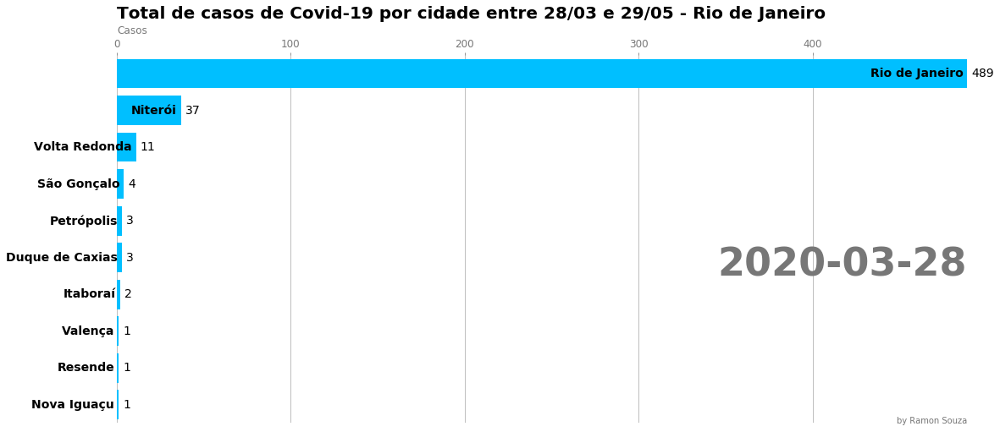

In [14]:
df_rj = df[df['state'] == 'Rio de Janeiro']

fig, ax = plt.subplots(figsize=(18, 8))
def racing_barchart(data):
    dff = df_rj[df_rj['date'] == data].sort_values(by='cases', ascending=True).tail(10)
    ax.clear()
    ax.barh(dff['name'], dff['cases'], color='deepskyblue')
    dx = dff['cases'].max() / 200
    for i, (cases, state) in enumerate(zip(dff['cases'], dff['name'])):
        ax.text(cases-dx, i, state, size=14, weight=600, ha='right', va='center')
        ax.text(cases+dx, i, f'{cases:,.0f}', size=14, ha='left', va='center')
    
    ax.text(1, 0.4, data.date(), transform=ax.transAxes, color='#777777', size=46,
                ha='right', weight=800)
    ax.text(0, 1.06, 'Casos', transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.10, 'Total de casos de Covid-19 por cidade entre 28/03 e 29/05 - Rio de Janeiro',
           transform=ax.transAxes, size=20, weight=600, ha='left')
    ax.text(1, 0, 'by Ramon Souza', transform=ax.transAxes, ha='right',
           color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
animator = animation.FuncAnimation(fig, racing_barchart, 
                                   frames=pd.date_range(start="2020-03-28",end=last_date))
HTML(animator.to_jshtml()) 

In [12]:
# Gráfico da Evolução do Total de casos e mortes por dia no Brasil
trace_1 = go.Scatter(x=df_total_cases_deaths_brazil['date'], 
                    y=df_total_cases_deaths_brazil['cases'], 
                    name="Casos", 
                    mode="lines+markers")  
trace_2 = go.Scatter(x=df_total_cases_deaths_brazil['date'], 
                    y=df_total_cases_deaths_brazil['deaths'], 
                    name="Mortes", 
                    mode="lines+markers")  

mydata = go.Data([trace_1, trace_2])
mylayout = go.Layout(title="Evolução do Total de Casos e Mortes no Brasil",
                    xaxis_title='Data', yaxis_title='Casos/Mortes', legend_title='Classe',
                    legend=dict(x=0.02,y=0.98))
fig = go.Figure(data=mydata, layout=mylayout)
fig.show()

C:\Users\ramon\Anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:40: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




In [15]:
# Gráfico de População x Total de Casos por Cidade do Rio de Janeiro (Indicativo de Mortalidade)
c = pd.merge(df_rj[df_rj['date'] == last_date], df_pop)
c['Mortalidade'] = c['deaths']/c['cases']
fig = px.scatter(c, x='População', y='cases', title='População x Total de Casos por Cidade - Rio de Janeiro', 
                 size='cases', color='Mortalidade', hover_name=c['name'], 
                 log_x=True, log_y=True, size_max=60)
fig.update_layout(xaxis_title='População',
    yaxis_title='Casos')
fig.show()

C:\Users\ramon\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Comparing Series of datetimes with 'datetime.date'.  Currently, the
'datetime.date' is coerced to a datetime. In the future pandas will
not coerce, and 'the values will not compare equal to the
'datetime.date'. To retain the current behavior, convert the
'datetime.date' to a datetime with 'pd.Timestamp'.



In [26]:
# Salvar gráfico anterior no site da biblioteca plotly
import chart_studio
import chart_studio.plotly as py
import chart_studio.tools as tls

username = 'ramonjs'
api_key = 'PuSNdGco8T1idHPJCzRr'

chart_studio.tools.set_credentials_file(username=username, api_key=api_key)

py.plot(fig, 
        filename='Gráfico: População x Total de Casos por Cidade - Rio de Janeiro',
        auto_open=True)

'https://plotly.com/~ramonjs/1/'

In [32]:
list_city_rj = c.groupby('name').sum().sort_values(
                            by='cases', ascending=False).reset_index()
list_city_rj = list_city_rj.nlargest(5, 'cases')
list_city_rj = list_city_rj['name'].tolist()
list_city_rj

df_city_cases_day = df_rj[['date', 'name', 'cases']]
df_city_cases_day = df_city_cases_day[
            df_city_cases_day['name'].isin(list_city_rj)]
# Função pra calcular número de casos por dia
def acum2pd(df_conf):
    df_conf_pd = df_conf.copy()
    for col in df_conf.columns:
        for i,x in enumerate(df_conf_pd[col]):
            if i != 0:
                pdia = df_conf[col][i]-df_conf[col][i-1]
                if pdia < 0:
                    df_conf_pd[col][i] = 0
                    df_conf[col][i] = df_conf[col][i-1]
                else:
                    df_conf_pd[col][i] = pdia
    return df_conf_pd

acum2pd(df_city_cases_day)

KeyError: 1